# Face recognition

## OpenCV

### Loading the dataset

- Yale faces database: http://vision.ucsd.edu/content/yale-face-database

In [2]:
from PIL import Image
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import zipfile
path = '/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces.zip'
zib_object = zipfile.ZipFile(file = path, mode = 'r')
zib_object.extractall('./')
zib_object.close()

### Pre-processing the images

In [4]:
import os
print(os.listdir('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/train'))
def get_image_data():
  paths = [os.path.join('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/train', f) for f in os.listdir('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/train')]
  faces = []
  ids = []
  for path in paths:
    image = Image.open(path).convert('L')
    image_np = np.array(image, 'uint8')
    id = int(os.path.split(path)[1].split('.')[0].replace('subject', ''))
    ids.append(id)
    faces.append(image_np)
  return np.array(ids), faces

['subject01.glasses.gif', 'subject01.leftlight.gif', 'subject01.noglasses.gif', 'subject01.normal.gif', 'subject01.sad.gif', 'subject01.rightlight.gif', 'subject01.sleepy.gif', 'subject01.surprised.gif', 'subject01.wink.gif', 'subject02.glasses.gif', 'subject02.happy.gif', 'subject02.noglasses.gif', 'subject02.normal.gif', 'subject02.rightlight.gif', 'subject02.sleepy.gif', 'subject02.sad.gif', 'subject02.surprised.gif', 'subject03.centerlight.gif', 'subject02.wink.gif', 'subject03.happy.gif', 'subject03.noglasses.gif', 'subject03.normal.gif', 'subject03.rightlight.gif', 'subject03.sad.gif', 'subject03.sleepy.gif', 'subject03.surprised.gif', 'subject03.wink.gif', 'subject04.centerlight.gif', 'subject04.glasses.gif', 'subject04.happy.gif', 'subject04.noglasses.gif', 'subject04.rightlight.gif', 'subject04.normal.gif', 'subject04.sleepy.gif', 'subject04.wink.gif', 'subject05.centerlight.gif', 'subject05.happy.gif', 'subject05.glasses.gif', 'subject05.leftlight.gif', 'subject05.noglasses.g

In [5]:
ids, faces =get_image_data()

In [6]:
ids, len(ids)

(array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,
         3,  2,  3,  3,  3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,
         4,  5,  5,  5,  5,  5,  5,  5,  5,  6,  5,  6,  6,  6,  6,  6,  6,
         6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,
         8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10,
        10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12,
        12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14,
        14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15,  4]), 135)

In [7]:
faces[0], len(faces), faces[0].shape

(array([[130, 130, 130, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ...,
        [255, 255, 255, ..., 252, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [ 68,  68,  68, ...,  68,  68,  68]], dtype=uint8), 135, (243, 320))

### Training the LBPH classifier

In [8]:
lbph_classifier = cv2.face.LBPHFaceRecognizer_create()
lbph_classifier.train(faces, ids)
lbph_classifier.write('lbph_classifier.yml')

### Recognizing faces

In [9]:
lbph_face_classifier = cv2.face.LBPHFaceRecognizer_create()
lbph_face_classifier.read('/content/lbph_classifier.yml')
test_image = '/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/test/subject05.surprised.gif'
image = Image.open(test_image).convert('L')
image_np = np.array(image, 'uint8')
image_np.shape

(243, 320)

In [10]:
prediction = lbph_face_classifier.predict(image_np)
prediction

(5, 9.404416693842116)

In [11]:
expected_output = int(os.path.split(test_image)[1].split('.')[0].replace('subject', ''))
expected_output

5

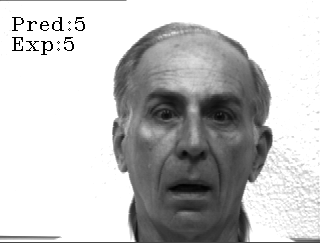

In [12]:
cv2.putText(image_np, 'Pred:' +str(prediction[0]), (10, 30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255, 0))
cv2.putText(image_np, 'Exp:' +str(expected_output), (10, 50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,255, 0))
cv2_imshow(image_np)

### Evaluating the face classifier

In [13]:
paths = [os.path.join('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/test', f) for f in os.listdir('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Datasets/yalefaces/test')]
predictions = []
expected_outputs = []
for path in paths:
  image = Image.open(path).convert('L')
  image_np = np.array(image, 'uint8')
  prediction, _ = lbph_face_classifier.predict(image_np)
  expected_output = int(os.path.split(path)[1].split('.')[0].replace('subject',''))
  predictions.append(prediction)
  expected_outputs.append(expected_output)


In [14]:
predictions = np.array(predictions)
expected_outputs = np.array(expected_outputs)

In [15]:
type(predictions)

numpy.ndarray

In [16]:
predictions

array([ 1,  1,  4,  5,  3,  9,  9,  4,  5,  5, 14,  6,  7,  9,  4,  8,  7,
        9,  4, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15,  7])

In [17]:
expected_outputs

array([ 1,  1,  2,  2,  3,  3,  4,  4,  5,  5,  6,  6,  7,  7,  8,  8,  9,
        9, 10, 10, 11, 11, 12, 12, 13, 13, 14, 14, 15, 15])

In [18]:
from sklearn.metrics import accuracy_score
accuracy_score(expected_outputs, predictions)

0.6666666666666666

In [19]:
len(predictions)

30

In [20]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(expected_outputs, predictions)
cm

array([[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]])

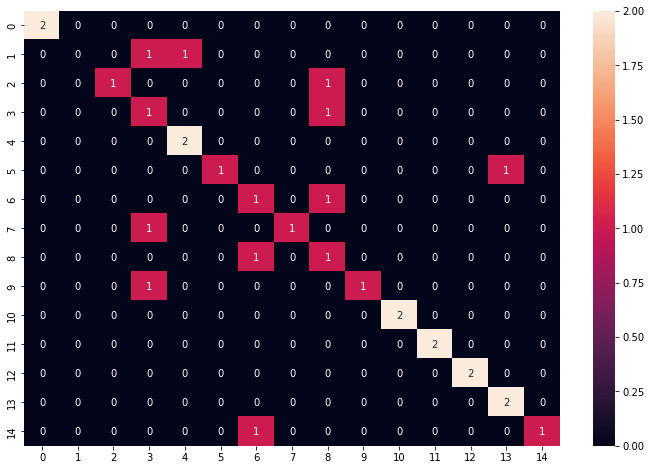

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(12,8))
sns.heatmap(cm, annot=True)
plt.show()

## Dlib

In [22]:
import dlib

### Detecting facial points

In [23]:
face_detector = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Weights/shape_predictor_68_face_landmarks.dat')

In [24]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people2.jpg')

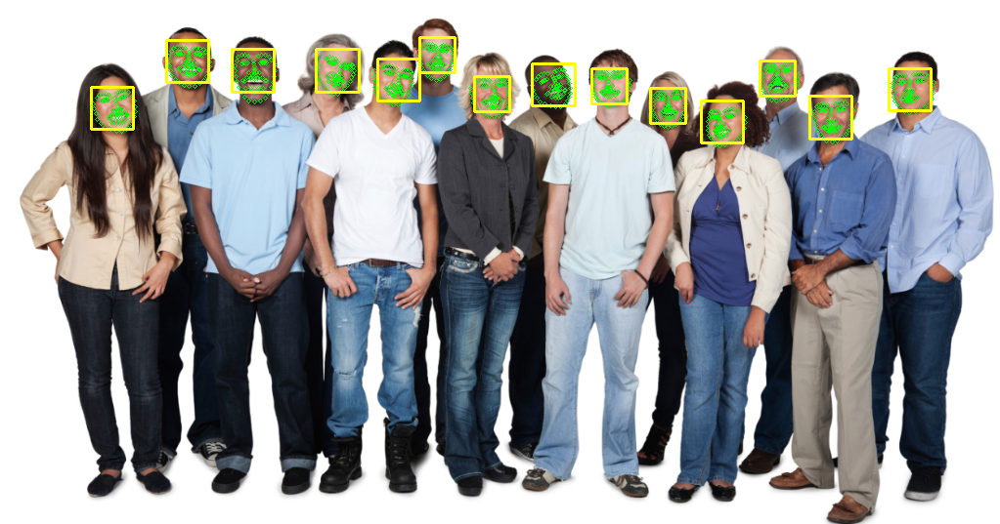

In [25]:
face_detection = face_detector(image, 1)
for face in face_detection:
  points = points_detector(image, face)
  for point in points.parts():
    cv2.circle(image, (point.x, point.y), 2, (0, 255, 0), 1)
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0,255,255), 2)
cv2_imshow(image)

### Detecting facial descriptors

In [26]:
import os

In [27]:
face_detector = dlib.get_frontal_face_detector()
points_detector = dlib.shape_predictor('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Weights/shape_predictor_68_face_landmarks.dat')
face_descriptor_extractor = dlib.face_recognition_model_v1('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Weights/dlib_face_recognition_resnet_model_v1.dat')

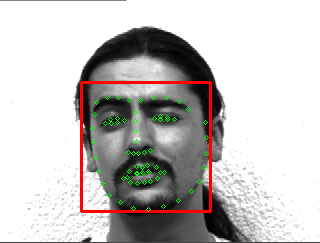

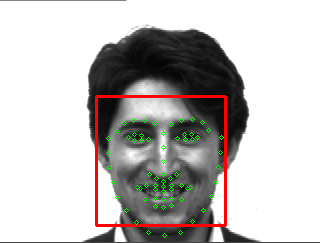

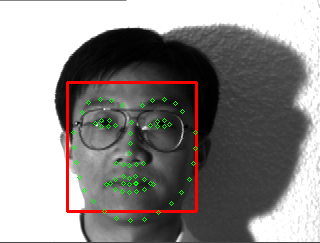

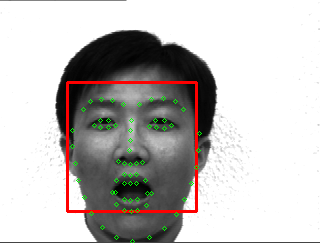

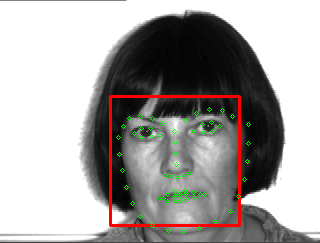

...

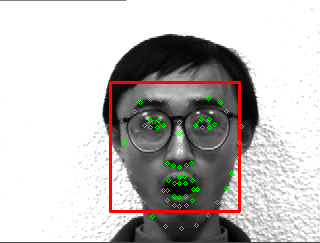

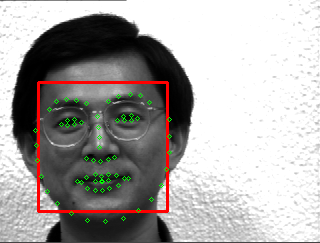

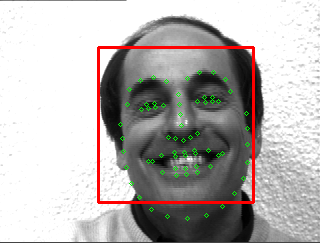

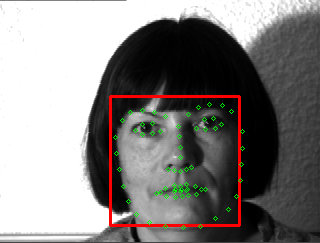

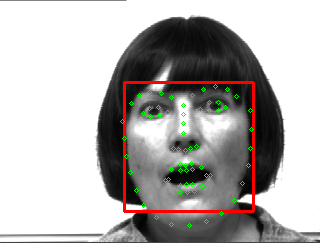

In [29]:
index = {}
idx = 0
face_descriptors = None

paths = [os.path.join('/content/yalefaces/train', f) for f in os.listdir('/content/yalefaces/train')]
for path in paths:
  image = Image.open(path).convert('RGB')
  image_np = np.array(image, 'uint8')
  face_detection = face_detector(image_np, 1)
  for face in face_detection:
    l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
    cv2.rectangle(image_np, (l, t), (r, b), (0, 0, 255), 2)

    points = points_detector(image_np, face)
    for point in points.parts():
      cv2.circle(image_np, (point.x, point.y), 2, (0, 255, 0), 1)

    face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np, points)
    face_descriptor = [f for f in face_descriptor]
    face_descriptor = np.asarray(face_descriptor, dtype=np.float64)
    face_descriptor = face_descriptor[np.newaxis, :]
    if face_descriptors is None:
      face_descriptors = face_descriptor
    else:
      face_descriptors = np.concatenate((face_descriptors, face_descriptor), axis = 0)

    index[idx] = path
    idx += 1
    

  cv2_imshow(image_np)

In [30]:
face_descriptors.shape

(132, 128)

In [31]:
face_descriptors

array([[-0.16389528,  0.07845423,  0.10400569, ..., -0.00969103,
         0.10305431,  0.0780731 ],
       [-0.11506258,  0.16287738, -0.00039474, ..., -0.15297823,
         0.08230641,  0.04687255],
       [-0.09598441,  0.11094986,  0.07923442, ...,  0.01291303,
         0.02708825,  0.04463544],
       ...,
       [-0.0234788 ,  0.09603493,  0.00068346, ..., -0.04134002,
         0.06291588,  0.02539283],
       [-0.13401428,  0.11617199,  0.03338566, ...,  0.06328257,
         0.10366515,  0.01890874],
       [-0.14703867,  0.09152189,  0.00213964, ..., -0.00104487,
         0.08834967,  0.01526631]])

### Calculating the distance between faces

In [32]:
np.linalg.norm(face_descriptors[0] - face_descriptors[0])

0.0

In [33]:
np.linalg.norm(face_descriptors[131] - face_descriptors[130])

0.4728652364867345

In [34]:
np.linalg.norm(face_descriptors[131] - face_descriptors, axis =1)

array([0.65253081, 0.72779293, 0.80566256, 0.61146463, 0.38504093,
       0.67255573, 0.69600045, 0.62271248, 0.6893934 , 0.62968173,
       0.71671713, 0.61907464, 0.69861707, 0.66553877, 0.69600045,
       0.70019625, 0.68829638, 0.72718398, 0.85393927, 0.7874175 ,
       0.72721123, 0.79222531, 0.66258429, 0.67726001, 0.64186622,
       0.75262478, 0.65439268, 0.65005336, 0.65355969, 0.87593424,
       0.84186139, 0.65758536, 0.70346546, 0.81106356, 0.72357929,
       0.72893471, 0.60017909, 0.40749093, 0.70120107, 0.71152358,
       0.6574777 , 0.88913695, 0.68923733, 0.77529032, 0.67021528,
       0.68468723, 0.68590562, 0.69846338, 0.68962164, 0.65355969,
       0.68969825, 0.67538327, 0.70130915, 0.70264658, 0.70715753,
       0.77325165, 0.79156596, 0.39411346, 0.79831527, 0.75939338,
       0.86561708, 0.77221221, 0.69677749, 0.78418173, 0.80639985,
       0.71162168, 0.83682658, 0.73611627, 0.67621321, 0.69068905,
       0.3302927 , 0.70844798, 0.7042026 , 0.6780195 , 0.63750

In [35]:
np.linalg.norm(face_descriptors[0] - face_descriptors[1:], axis=1)

array([0.67008072, 0.85531444, 0.70402675, 0.72049811, 0.37781581,
       0.65694162, 0.60447038, 0.82540151, 0.67964232, 0.66687126,
       0.71909375, 0.68290413, 0.64534709, 0.65694162, 0.53163645,
       0.70666102, 0.64178275, 0.6974534 , 0.69875522, 0.64744301,
       0.70259607, 0.70974873, 0.67868119, 0.55105064, 0.83542869,
       0.69971345, 0.58132017, 0.29962622, 0.72328995, 0.64495795,
       0.72262539, 0.63445648, 0.69414838, 0.67085313, 0.59152815,
       0.76382775, 0.68175557, 0.59363107, 0.65639571, 0.62555367,
       0.76509879, 0.68840411, 0.65759833, 0.69200785, 0.62642752,
       0.68961307, 0.6750077 , 0.77003416, 0.29962622, 0.74294564,
       0.68770573, 0.82889853, 0.38034778, 0.61097262, 0.68172418,
       0.67929289, 0.6935762 , 0.81719903, 0.692146  , 0.71330168,
       0.60186839, 0.71001649, 0.62247069, 0.47111312, 0.57970912,
       0.70154133, 0.64088075, 0.77220632, 0.60293356, 0.6809631 ,
       0.77585353, 0.67963143, 0.64943288, 0.37028814, 0.67321

In [36]:
np.linalg.norm(face_descriptors[0] - face_descriptors[1:], axis=1)[91]

0.7472605742353546

In [37]:
np.argmin(np.linalg.norm(face_descriptors[0] - face_descriptors[1:], axis = 1))

84

In [38]:
np.linalg.norm(face_descriptors[0] - face_descriptors[1:], axis=1)[84]

0.2825252632194323

### Detecting faces with Dlib

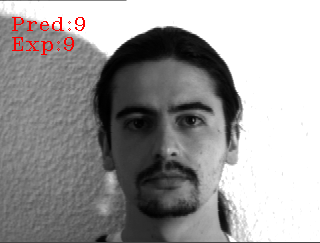

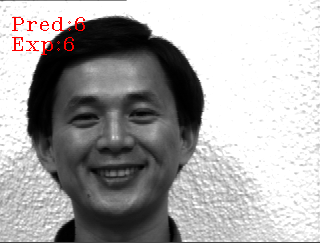

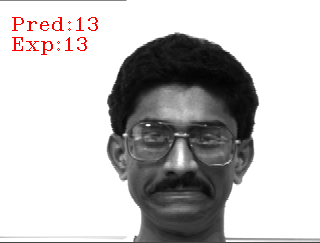

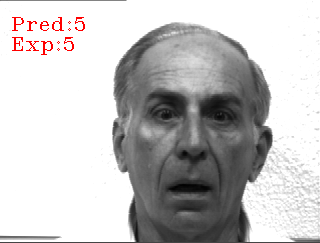

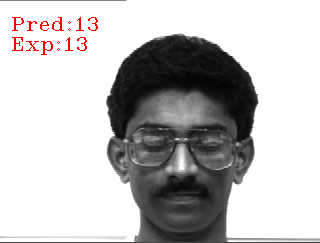

...

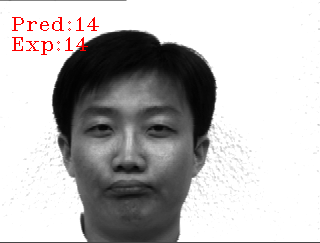

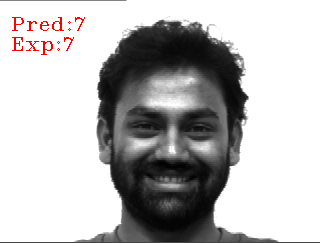

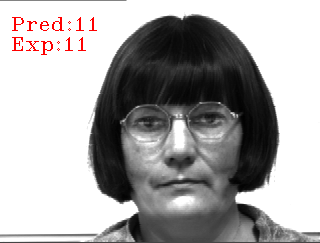

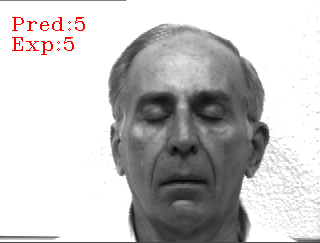

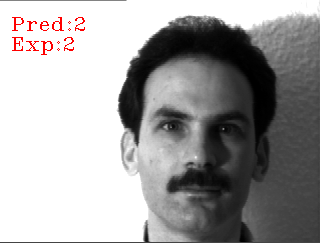

In [43]:
threshold = 0.5
predictions = []
expected_outputs = []
paths = [os.path.join('/content/yalefaces/test', f) for f in os.listdir('/content/yalefaces/test')]
for path in paths:
  image = Image.open(path).convert('RGB')
  image_np = np.array(image, 'uint8')
  face_detection = face_detector(image_np, 1)
  for face in face_detection:
    points = points_detector(image_np, face)
    face_descriptor = face_descriptor_extractor.compute_face_descriptor(image_np, points)
    face_descriptor = [f for f in face_descriptor]
    face_descriptor = np.asarray(face_descriptor, dtype = np.float64)
    face_descriptor = face_descriptor[np.newaxis, :]
    #Calculating distance b/w faces
    distances = np.linalg.norm(face_descriptor - face_descriptors, axis =1)
    min_index = np.argmin(distances)
    min_distances = distances[min_index]
    if min_distances <= threshold:
      name_pred = int(os.path.split(index[min_index])[1].split('.')[0].replace('subject', ''))
    else:
      name_pred = 'Not identified'
    name_real = int(os.path.split(path)[1].split('.')[0].replace('subject', ''))
    predictions.append(name_pred)
    expected_outputs.append(name_real)

    cv2.putText(image_np, 'Pred:' +str(name_pred), (10,30), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,0,255))
    cv2.putText(image_np, 'Exp:' +str(name_real), (10, 50), cv2.FONT_HERSHEY_COMPLEX_SMALL, 1, (0,0,255))

  cv2_imshow(image_np)
predictions = np.array(predictions)
expected_outputs = np.array(expected_outputs)  

In [44]:
from sklearn.metrics import accuracy_score
print('Accuracy Score:', accuracy_score(expected_outputs, predictions))

Accuracy Score: 1.0


We got 100% accuracy in using the Dlib libraries. Dlib performed well as compare to LBPH.